### SmartHealth: ESC-50: Dataset for Environmental Sound Classification

https://github.com/karolpiczak/ESC-50

http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/

https://towardsdatascience.com/music-genre-classification-with-python-c714d032f0d8





Assignment 4:  Devika Pace

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import wave
import soundfile as sf
import os
import glob
import librosa
import librosa.display
import IPython.display as ipd
from sklearn.preprocessing import LabelEncoder, scale
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv1D, GlobalAveragePooling1D, MaxPooling1D
from keras.models import load_model
from warnings import simplefilter

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Create Dataset

In [3]:
# Read ESC-50 metadata
files = pd.read_csv('/content/drive/MyDrive/esc50.csv')
files.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [4]:
coughing = files[files['category']=='coughing']
print(len(coughing))

40


In [ ]:
# Assemble dataset
os.mkdir('003 - Coughing - Target')
src = 'ESC-50-master/audio/'
dest = '003 - Coughing'
src_files = list(coughing.filename)
for file_name in src_files:
    full_file_name = os.path.join(src, file_name)
    if os.path.isfile(full_file_name):
        shutil.copy(full_file_name, dest)
parent_dest = 'dataset-ESC5-small'
destination = shutil.copytree(dest, parent_dest) 

### EDA:  Audio Signals

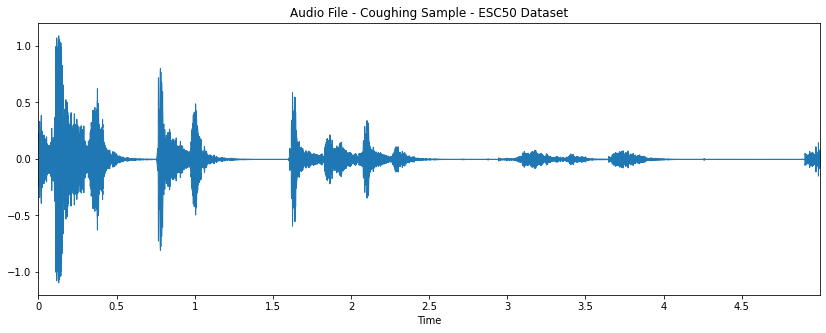

In [108]:
import librosa.display

audio_fpath = '/content/drive/MyDrive/dataset-ESC5/003 - Coughing - Target'
audio_clips = os.listdir(audio_fpath)

x, sr = librosa.load(audio_fpath+'/'+audio_clips[2], sr=44100)

plt.figure(figsize=(14, 5))
plt.title('Audio File - Coughing Sample - ESC50 Dataset')
librosa.display.waveplot(x, sr=sr);

#### Spectrogam Views

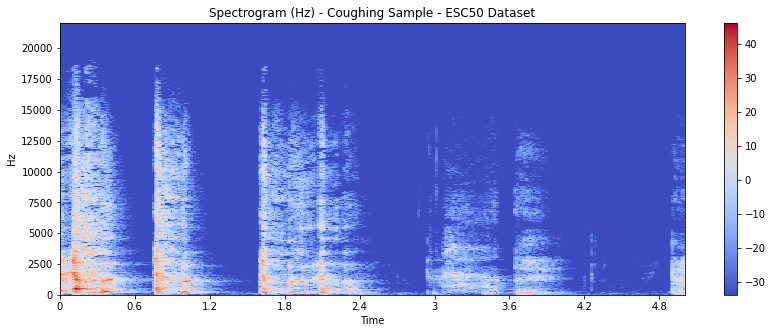

In [107]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()
plt.title('Spectrogram (Hz) - Coughing Sample - ESC50 Dataset');

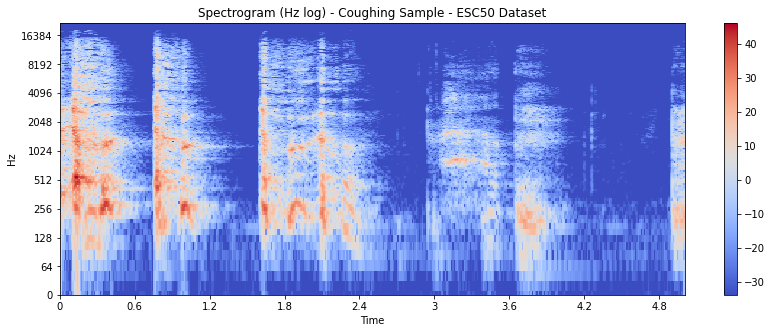

In [29]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Spectrogram (Hz log) - Coughing Sample - ESC50 Dataset');

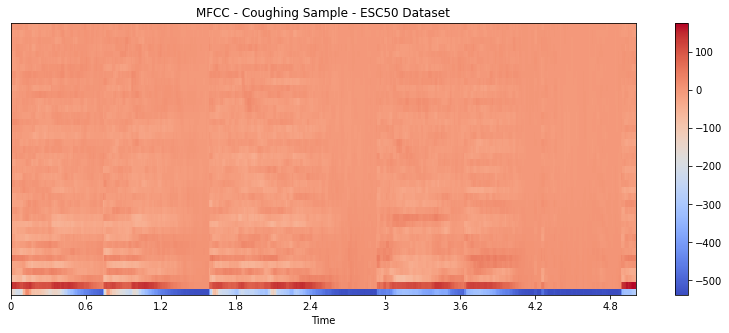

In [30]:
plt.figure(figsize=(14, 5))
mfccs2 = librosa.feature.mfcc(x, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs2, sr=sr, x_axis='time')
plt.colorbar()
plt.title('MFCC - Coughing Sample - ESC50 Dataset');

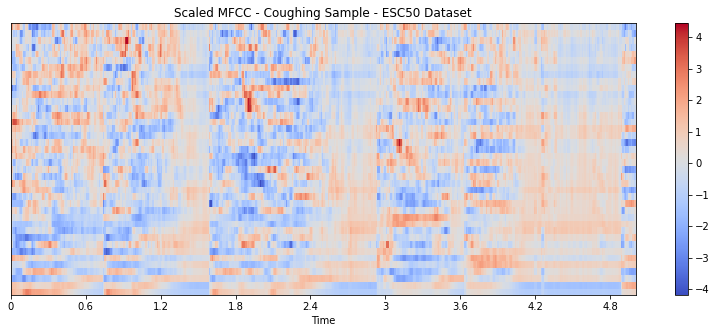

In [32]:
plt.figure(figsize=(14, 5))
mfccs3 = scale(mfccs2, axis=1)
librosa.display.specshow(mfccs3, sr=sr, x_axis='time')
plt.colorbar()
plt.title('Scaled MFCC - Coughing Sample - ESC50 Dataset');

### Feature Extraction

In [17]:
# Mel-Frequency Cepstrum (MFCC) feature
def get_features(file_name):
    if file_name: 
        X, sample_rate = sf.read(file_name, dtype='float32')
    mfccs = librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40)
    mfccs_scaled = np.mean(mfccs.T,axis=0)
    return mfccs_scaled

cough = get_features('/content/drive/MyDrive/dataset-ESC5/003 - Coughing - Target/1-58792-A-24.ogg')
cough.shape, cough

((40,), array([-2.4687700e+02,  7.1692818e+01, -1.9256151e+01,  9.0067463e+00,
        -1.5745464e+01,  7.2809253e+00, -7.3422184e+00, -4.7410927e+00,
        -6.7835283e+00,  4.3236947e+00,  1.4832141e+00,  4.5377040e+00,
         3.4629462e+00,  5.2422361e+00,  2.3282645e+00,  3.9050057e+00,
         9.3775558e-01,  9.7573256e-01,  1.6514819e+00,  3.7379630e+00,
         1.5651277e+00,  1.3736920e+00,  2.0689116e+00,  1.9427311e+00,
         8.9329779e-01,  7.4550760e-01,  4.9791634e-02,  1.6274213e+00,
         1.1028230e+00, -7.1557689e-01, -1.1112744e+00,  3.0379850e-01,
         9.5020986e-01,  5.8654606e-01, -9.8215336e-01,  1.7896790e-02,
         9.4315100e-01,  1.7839180e+00,  1.4569353e+00,  8.8519943e-01],
       dtype=float32))

In [18]:
# Spectrogram
def get_specgram(file_name):
    if file_name:
        X, sample_rate = sf.read(file_name, dtype='float32')
        S = librosa.feature.melspectrogram(y=X, sr=sample_rate)
        fig, ax = plt.subplots()
        S_dB = librosa.power_to_db(S, ref=np.max)
        img = librosa.display.specshow(S_dB,sr=sr)
    return img

Extracting file  /content/drive/MyDrive/dataset-ESC5/001 - Dog bark/2-118964-A.ogg 001 - Dog bark 0
/content/drive/MyDrive/dataset-ESC5-specgrams/001 - Dog bark/2-118964-A.jpg
Extracting file  /content/drive/MyDrive/dataset-ESC5/001 - Dog bark/4-191687-A.ogg 001 - Dog bark 0
/content/drive/MyDrive/dataset-ESC5-specgrams/001 - Dog bark/4-191687-A.jpg
Extracting file  /content/drive/MyDrive/dataset-ESC5/001 - Dog bark/1-110389-A.ogg 001 - Dog bark 0
/content/drive/MyDrive/dataset-ESC5-specgrams/001 - Dog bark/1-110389-A.jpg
Extracting file  /content/drive/MyDrive/dataset-ESC5/001 - Dog bark/5-208030-A.ogg 001 - Dog bark 0
/content/drive/MyDrive/dataset-ESC5-specgrams/001 - Dog bark/5-208030-A.jpg
Extracting file  /content/drive/MyDrive/dataset-ESC5/001 - Dog bark/4-184575-A.ogg 001 - Dog bark 0
/content/drive/MyDrive/dataset-ESC5-specgrams/001 - Dog bark/4-184575-A.jpg
Extracting file  /content/drive/MyDrive/dataset-ESC5/001 - Dog bark/2-114587-A.ogg 001 - Dog bark 0
/content/drive/MyDri

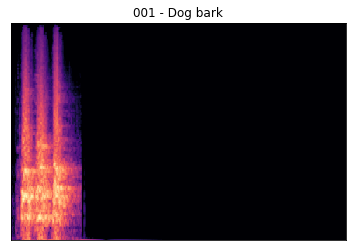

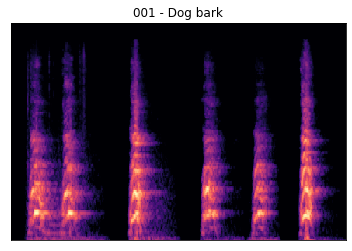

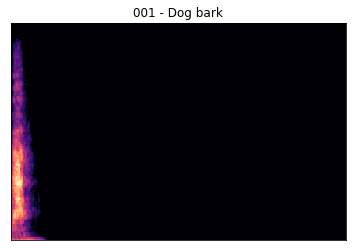

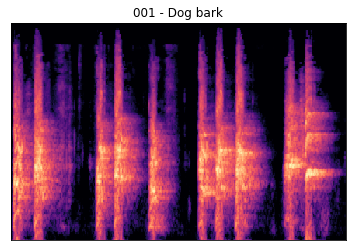

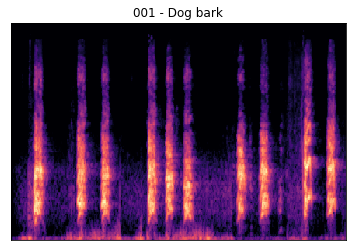

...

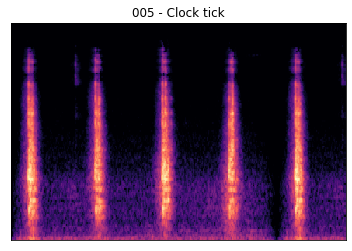

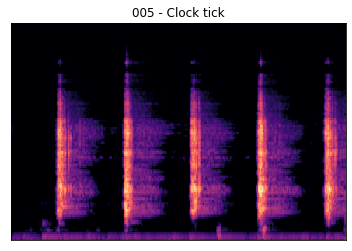

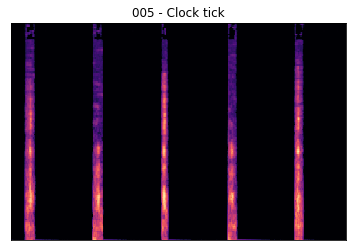

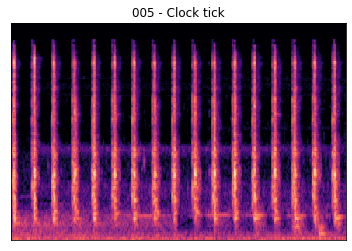

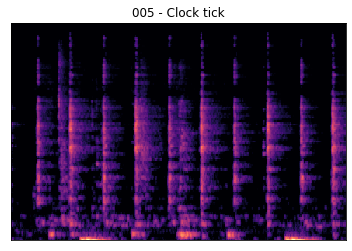

In [36]:
# Extract Features: mfcc, specgram, file_name, image_name, label
def extract_features(target, src, dest):
    sub_dirs = os.listdir(src)
    sub_dirs.sort()
    features_list = []
    # binary label
    for label, sub_dir in enumerate(sub_dirs):  
        if sub_dir == target:
            label = 1
        else:
            label = 0
        for file_path in glob.glob(os.path.join(src, sub_dir,"*.ogg")):
            print("Extracting file ", file_path, sub_dir, label)
            try:
                # extract mfcc
                mfccs = get_features(file_path)
                # extract spectrogram
                spec = get_specgram(file_path)
                # extract paths
                file_name = file_path.split('/')[-1]
                image_name = file_name.split('.')[0] + '.jpg'
                new_path = dest+ '/' + sub_dir + '/' + image_name
                print(new_path)
                # view each spectrogram with class
                plt.title(sub_dir)
                plt.savefig(new_path)
            except Exception as e:
                print("Extraction error")
                continue
            features_list.append([sub_dir, file_name, image_name, mfccs, label])

    features_df = pd.DataFrame(features_list, columns = ['sub_dir', 'file_name', 'image_name', 'feature', 'class_label'])
    print(features_df.head())    
    return features_df

target = '003 - Coughing - Target'
src = '/content/drive/MyDrive/dataset-ESC5'
dest = '/content/drive/MyDrive/dataset-ESC5-specgrams'
features_df = extract_features(target, src, dest)

In [37]:
features_df

,sub_dir,file_name,image_name,feature,class_label
0,001 - Dog bark,2-118964-A.ogg,2-118964-A.jpg,"[-406.9836, 34.962643, -5.32027, -1.1214161, -...",0
1,001 - Dog bark,4-191687-A.ogg,4-191687-A.jpg,"[-393.33954, 78.339806, 4.843938, -7.6767797, ...",0
2,001 - Dog bark,1-110389-A.ogg,1-110389-A.jpg,"[-586.62494, 11.93222, -0.9867105, -1.8025453,...",0
3,001 - Dog bark,5-208030-A.ogg,5-208030-A.jpg,"[-234.37257, 99.578835, -82.46293, -36.53096, ...",0
4,001 - Dog bark,4-184575-A.ogg,4-184575-A.jpg,"[-444.4998, 108.07907, -9.716747, -29.375694, ...",0
...,...,...,...,...,...
195,005 - Clock tick,5-212181-A.ogg,5-212181-A.jpg,"[-614.1926, 101.28882, 8.087574, 4.682997, -7....",0
196,005 - Clock tick,5-219342-A.ogg,5-219342-A.jpg,"[-621.2384, 66.74991, -32.935448, -16.051538, ...",0
197,005 - Clock tick,5-210571-A.ogg,5-210571-A.jpg,"[-698.18726, 19.73669, -0.7855806, 3.0810955, ...",0
198,005 - Clock tick,5-201194-A.ogg,5-201194-A.jpg,"[-522.88776, 117.82044, 5.081324, 22.482498, -...",0


In [38]:
# error check
features_df.class_label.value_counts()

0    160
1     40
Name: class_label, dtype: int64

In [71]:
# save extracted feature table
features_df.to_csv('audio_features_df.csv', index=False)

### Model Building, Training, and Evaluation


Evaluation Methods

In [45]:
def evaluate_model(history,X_test,y_test,model):
    scores = model.evaluate((X_test),y_test, verbose=0)
    print("Accuracy: %.2f%%" % (scores[1]*100))
    
    print(history)
    fig1, ax_acc = plt.subplots(figsize=(5,5))
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Model - Accuracy')
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.legend(['Training', 'Validation'], loc='lower right')

    plt.show();
    
    fig2, ax_loss = plt.subplots(figsize=(5,5))
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Model- Loss')
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.legend(['Training', 'Validation'], loc='upper right')

    plt.show();
    target_names=['CAD','MI','Other','TIA']
    
    y_true=[]
    for element in y_test:
        y_true.append(np.argmax(element))
    prediction_proba=model.predict(X_test)
    prediction=np.argmax(prediction_proba,axis=1)
    cnf_matrix = confusion_matrix(y_true, prediction)


In [41]:
import itertools
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from warnings import simplefilter

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
        
    plt.figure(figsize=(5,5))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [42]:
def print_scores(y_test, y_pred):
    print(f'Accuracy: {accuracy_score(y_test, y_pred):0.2f}')
    print(f'F1 Score: {f1_score(y_test, y_pred, average="macro"):0.2f}')
    print(f'Precision: {precision_score(y_test, y_pred, average="macro"):0.2f}')
    print(f'Recall: {recall_score(y_test, y_pred, average="macro"):0.2f}')

Build and Train

In [66]:
def get_numpy_array(features_df):
    X = np.array(features_df.feature.tolist())
    y = np.array(features_df.class_label.tolist())
    # encode classification labels
    le = LabelEncoder()
    # one hot encoded labels
    yy = to_categorical(le.fit_transform(y))
    return X,yy,le

def get_train_test(X,y):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)
    return  X_train, X_test, y_train, y_test

def create_mlp(num_labels):
    model = Sequential()
    model.add(Dense(512,input_shape = (40,)))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(512,input_shape = (40,)))
    model.add(Activation('relu'))
    model.add(Dropout(0.7))
    model.add(Dense(num_labels))
    model.add(Activation('softmax'))
    return model

def train(model, X_train, X_test, y_train, y_test,model_file):    
    # compile the model 
    model.compile(loss = 'binary_crossentropy', metrics=['accuracy'], optimizer='adam')
    print(model.summary())
    print("training for 100 epochs with batch size 32")
    history = model.fit(X_train,y_train,batch_size= 32, epochs = 70, validation_data=(X_test,y_test))
    # save model to disk
    print("Saving model to disk")
    model.save(model_file)
    return history

def compute(X_test,y_test,model_file):
    # load model from disk
    loaded_model = load_model(model_file)
    score = loaded_model.evaluate(X_test,y_test)
    return score[0],score[1]*100


In [67]:
#convert into numpy array
X, y, le = get_numpy_array(features_df)

# split into training and testing data
X_train, X_test, y_train, y_test = get_train_test(X,y)
num_labels = y.shape[1]

# create model architecture
model = create_mlp(num_labels)

# train model
print("Training..")
history = train(model, X_train, X_test, y_train, y_test,"trained_mlp_bin4.h5")

# compute test loss and accuracy
test_loss, test_accuracy = compute(X_test, y_test,"trained_mlp_bin4.h5")
print("Test loss",test_loss)
print("Test accuracy",test_accuracy)

Training..
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 512)               20992     
                                                                 
 activation_12 (Activation)  (None, 512)               0         
                                                                 
 dropout_8 (Dropout)         (None, 512)               0         
                                                                 
 dense_13 (Dense)            (None, 512)               262656    
                                                                 
 activation_13 (Activation)  (None, 512)               0         
                                                                 
 dropout_9 (Dropout)         (None, 512)               0         
                                                                 
 dense_14 (Dense)            (None, 2)     

In [68]:
y_pred=model.predict(X_test)

Accuracy: 82.50%


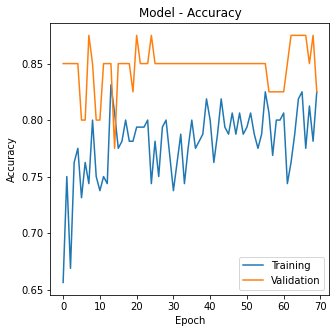

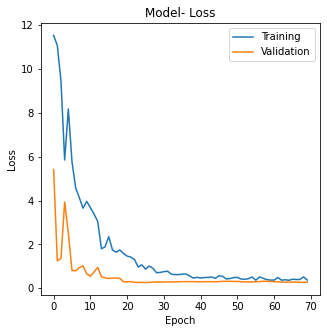

In [69]:
evaluate_model(history, X_test, y_test, model)

Confusion matrix, without normalization


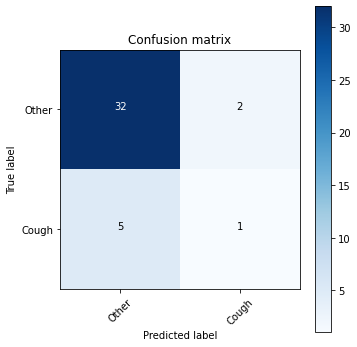

Accuracy: 0.82
F1 Score: 0.56
Precision: 0.60
Recall: 0.55


In [70]:
# Compute confusion matrix
simplefilter('ignore')
cnf_matrix = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(cnf_matrix, classes=['Other', 'Cough'], normalize=False,
                      title='Confusion matrix')
plt.show()
print_scores(y_test.argmax(axis=1), y_pred.argmax(axis=1))

Food for thought: why the accuracy is low? How to improve?

The accuracy may be low because of the file sampling resolution or features extracted.  It may also be because of an unbalanced dataset.  We could resample the dataset in terms of balancing classes or maintain a higher resolution of our audio files.  Also we could experiment more with the network architecture and training time.  A different amount of layers, neurons, dropout, etc, may improve our metrics.

### Compare with Teachable Machine

In [80]:
# recollect from dataframe with internal random state
features, labels = features_df.iloc[:,:-1], features_df.iloc[:, -1]
X_train, X_test, y_train, y_test = get_train_test(features, labels)

In [110]:
# model 2b: Teachable Machine
simplefilter('ignore')
from keras.models import load_model
from PIL import Image, ImageOps
import numpy as np

# Load the model
model = load_model('/content/drive/MyDrive/converted_keras_2/keras_model.h5')
model.compile(loss = 'binary_crossentropy',metrics=['accuracy'],optimizer='adam')
y_pred = []
for idx in range(len(X_test)):
    # Create the array of the right shape to feed into the keras model
    # The 'length' or number of images you can put into the array is
    # determined by the first position in the shape tuple, in this case 1.
    data = np.ndarray(shape=(1, 224, 224, 3), dtype=np.float32)
    # Replace this with the path to your image
    file_path = '/content/drive/MyDrive/dataset-ESC5-specgrams/' + X_test.iloc[idx]['sub_dir'] + '/' + X_test.iloc[idx]['image_name']
    image = Image.open(file_path)
    #resize the image to a 224x224 with the same strategy as in TM2:
    #resizing the image to be at least 224x224 and then cropping from the center
    size = (224, 224)
    image = ImageOps.fit(image, size, Image.ANTIALIAS)

    #turn the image into a numpy array
    image_array = np.asarray(image)
    #print(image_array.shape)
    image_array
    # Normalize the image
    normalized_image_array = (image_array.astype(np.float32) / 127.0) - 1
    # # Load the image into the array
    data[0] = normalized_image_array

    # run the inference
    prediction = np.argmax(model.predict(data)[0])
    #print(prediction)
    y_pred.append(prediction)

Confusion matrix, without normalization


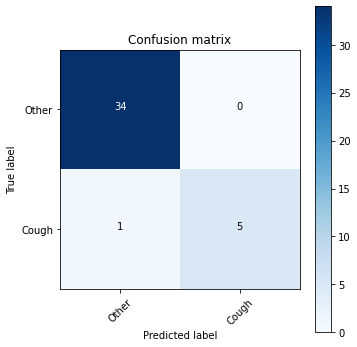

Accuracy: 0.97
F1 Score: 0.95
Precision: 0.99
Recall: 0.92


In [111]:
simplefilter('ignore')
cnf_matrix = confusion_matrix(y_test.argmax(axis=1), y_pred)
np.set_printoptions(precision=2)
plot_confusion_matrix(cnf_matrix, classes=['Other', 'Cough'], normalize=False,
                      title='Confusion matrix')
plt.show()
print_scores(y_test.argmax(axis=1), y_pred)

Teachable Machine has quite a bit better score that our model, though test accuracy is going down and loss is going up indicating that it may have overfit a bit.

From Teachable Machine Metrics:  Evaluation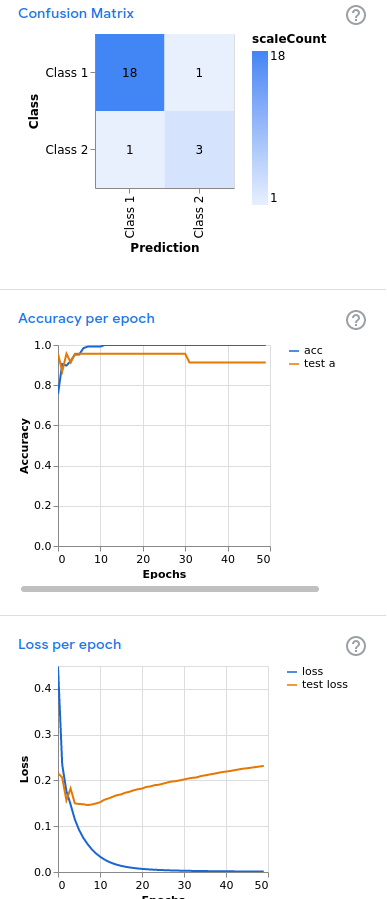